# **Book Detection on Shelf Using SIFT + FLANN + RANSAC**


---


**Objective**

In this project, we develop a traditional computer vision system that identifies books

**Techniques Used**

- SIFT for feature extraction
- FLANN for fast descriptor matching
- Lowe's ratio test for match filtering
- RANSAC for robust homography estimation
- Bounding box transformation for detection output

The system is capable of detecting multiple instances of each book per scene.


---





**1. Import Required Libraries and Load Dataset Paths**


In [2]:
import os, zipfile
import numpy as np
import cv2
import matplotlib.pyplot as plt
from google.colab import drive

drive.mount('/content/drive')
ZIP_PATH   = '/content/drive/MyDrive/dataset.zip'
EXTRACT_TO = '/content'

os.makedirs(EXTRACT_TO, exist_ok=True)
if not os.path.exists(os.path.join(EXTRACT_TO, '.unzipped_ok')):
    if not os.path.exists(ZIP_PATH):
        raise FileNotFoundError(f"Zip not found at: {ZIP_PATH}")
    with zipfile.ZipFile(ZIP_PATH, 'r') as zf:
        zf.extractall(EXTRACT_TO)
    open(os.path.join(EXTRACT_TO, '.unzipped_ok'), 'w').close()
print(f"Unzipped (or already present) at: {EXTRACT_TO}")
model_dir = '/content/dataset/models'
scene_dir = '/content/dataset/scenes'

model_files = sorted([f for f in os.listdir(model_dir) if f.endswith('.png')])
scene_files = sorted([f for f in os.listdir(scene_dir) if f.endswith('.jpg')])

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Unzipped (or already present) at: /content


**2. Load Grayscale Images into Memory**

We load all model and scene images as grayscale using OpenCV’s `cv2.imread()` function with the `cv2.IMREAD_GRAYSCALE` flag.

The result:
- `models` is a dictionary mapping model indices to grayscale images of book covers.
- `scenes` is a dictionary mapping scene indices to grayscale images of shelves.



In [3]:
# Load grayscale images into dictionaries
models = {
    i: cv2.imread(os.path.join(model_dir, f), cv2.IMREAD_GRAYSCALE)
    for i, f in enumerate(model_files)
}
scenes = {
    i: cv2.imread(os.path.join(scene_dir, f), cv2.IMREAD_GRAYSCALE)
    for i, f in enumerate(scene_files)
}

**3. Initialize SIFT Detector and FLANN Matcher**

**SIFT** is used for extracting keypoints and descriptors from the model and scene images.

**FLANN** is optimized for approximate nearest-neighbor search in high-dimensional spaces.

In [4]:
sift = cv2.SIFT_create()

flann_index_kdtree = 1
index_params = dict(algorithm=flann_index_kdtree, trees=5)
search_params = dict(checks=50)

flann = cv2.FlannBasedMatcher(index_params, search_params)

**4. Define the Book Detection Function Using SIFT + FLANN + RANSAC**

This function performs the following steps:

1. Extract SIFT keypoints and descriptors from the model and scene images.
2. Match descriptors using FLANN and filter them using Lowe's ratio test.
3. Iteratively apply RANSAC to find valid homographies:
   - For each valid match group, compute a transformation matrix (homography).
   - Use it to project the corners of the model book into the scene.
   - Store each detection as a bounding box with coordinates and area.
4. Prevent duplicates by tracking and excluding scene keypoints already used.

This allows detection of multiple instances of the same book in a single scene.


In [5]:
def detect_multiple_instances(img_model, img_scene, min_match_count=10, min_inliers=10):
    kp_model, des_model = sift.detectAndCompute(img_model, None)
    kp_scene, des_scene = sift.detectAndCompute(img_scene, None)

    if des_model is None or des_scene is None:
        return []

    matches = flann.knnMatch(des_model, des_scene, k=2)
    good_matches = [m for m, n in matches if m.distance < 0.7 * n.distance]

    instances = []
    used_scene_indices = set()

    while True:
        good_filtered = [m for m in good_matches if m.trainIdx not in used_scene_indices]
        if len(good_filtered) < min_match_count:
            break

        src_pts = np.float32([kp_model[m.queryIdx].pt for m in good_filtered]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp_scene[m.trainIdx].pt for m in good_filtered]).reshape(-1, 1, 2)

        H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
        if H is None or mask is None or mask.sum() < min_inliers:
            break

        inlier_matches = [good_filtered[i] for i in range(len(mask)) if mask[i]]
        inlier_indices = [m.trainIdx for m in inlier_matches]
        used_scene_indices.update(inlier_indices)

        h, w = img_model.shape
        corners = np.float32([[0, 0], [w, 0], [w, h], [0, h]]).reshape(-1, 1, 2)
        projected = cv2.perspectiveTransform(corners, H).reshape(4, 2).astype(int)

        instance = {
            "top_left": tuple(projected[0]),
            "top_right": tuple(projected[1]),
            "bottom_right": tuple(projected[2]),
            "bottom_left": tuple(projected[3]),
            "area": int(cv2.contourArea(projected)),
            "box": projected
        }
        instances.append(instance)

    return instances

**5. Define a Function to Draw Detected Book Instances**

`draw_boxes` function receives a grayscale scene image and a list of detected instances (each with a bounding box).

It converts the grayscale image to color, draws the polygonal box for each detected book, and labels it with the corresponding model ID.

In [ ]:
def draw_boxes(image, instances, model_id):
    if len(image.shape) == 2 or image.shape[2] == 1:
        image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)

    for inst in instances:
        box = np.array(inst['box']).reshape((-1, 1, 2))
        cv2.polylines(image, [box], True, (0, 255, 0), 2)
        cv2.putText(image, f"Book {model_id}", inst["top_left"], cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

    return image


**6. Run Detection on All Scenes and Print Results**

This is the main loop of the project. It does the following:

- Iterates over every scene image.
- For each scene, tries to detect all model books using the `detect_multiple_instances` function.
- Prints detailed information about each detected instance, including:
  - Corner coordinates
  - Area of the bounding box
- Draws the detected books on the image using `draw_boxes()`.
- Displays the annotated result using matplotlib.

This allows full validation of the detection pipeline.

In [23]:
def run_detection_and_report_all_models():
    for scene_id, img_scene in scenes.items():
        print(f"\nScene {scene_id} Analysis:\n" + "-"*40)
        img_out = cv2.cvtColor(img_scene, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(12, 8))

        for model_id, img_model in models.items():
            instances = detect_multiple_instances(img_model, img_scene)

            print(f"Book {model_id} - {len(instances)} instance(s) found:")
            for i, inst in enumerate(instances):
                print(f"  Instance {i+1} {{")
                print(f"    top_left: {inst['top_left']}, top_right: {inst['top_right']},")
                print(f"    bottom_right: {inst['bottom_right']}, bottom_left: {inst['bottom_left']},")
                print(f"    area: {inst['area']}px }}")

            if instances:
                img_out = draw_boxes(img_out, instances, model_id)

        plt.imshow(cv2.cvtColor(img_out, cv2.COLOR_BGR2RGB))
        plt.title(f"Scene {scene_id} - Detection Result")
        plt.axis("off")
        plt.show()



Scene 0 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 0 instance(s) found:
Book 17 - 0 instance(s) found:
Book 18 - 0 instance(s) found:
Book 19 - 0 instance(s) found:
Book 20 - 0 instance(s) found:
Book 21 - 0 instance(s) found:


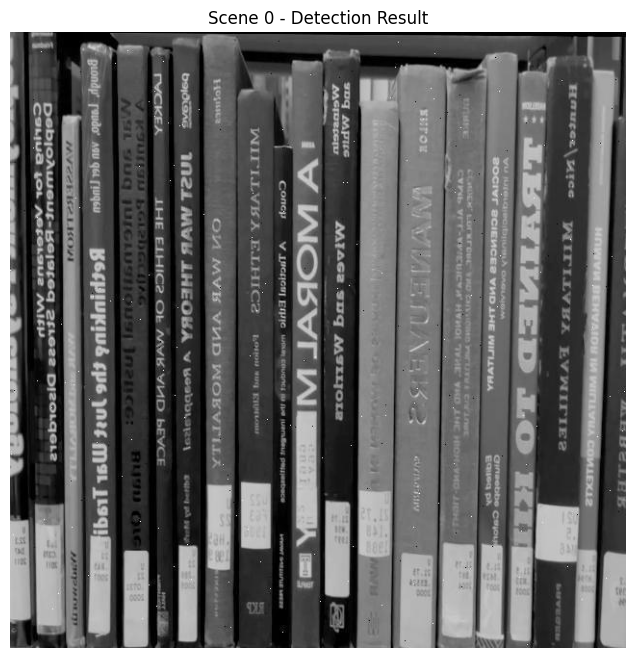


Scene 1 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 2 instance(s) found:
  Instance 1 {
    top_left: (np.int64(441), np.int64(42)), top_right: (np.int64(490), np.int64(42)),
    bottom_right: (np.int64(490), np.int64(521)), bottom_left: (np.int64(441), np.int64(521)),
    area: 23471px }
  Instance 2 {
    top_left: (np.int64(490), np.int64(40)), top_right: (np.int64(536), np.int64(39)),
    bottom_right: (np.int64(530), np.int64(518)), bottom_left: (np.int64(483), np.int64(514)),
    area: 22167px }
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 0 instance

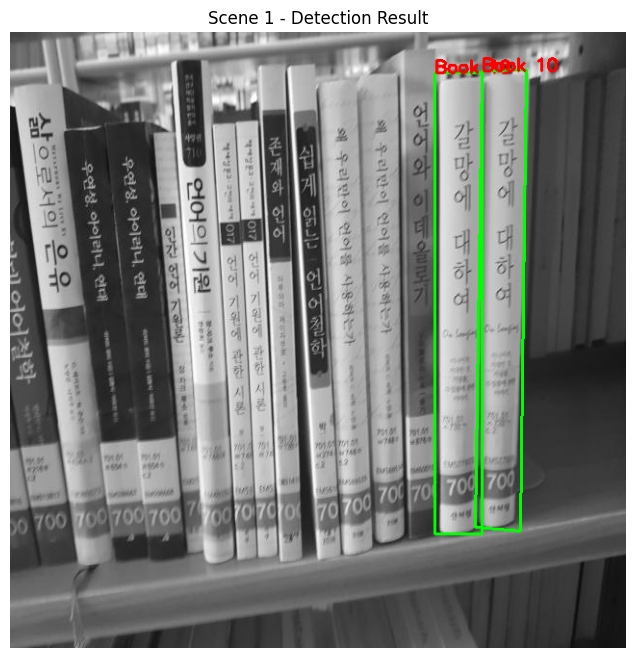


Scene 2 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 1 instance(s) found:
  Instance 1 {
    top_left: (np.int64(332), np.int64(203)), top_right: (np.int64(360), np.int64(204)),
    bottom_right: (np.int64(360), np.int64(504)), bottom_left: (np.int64(332), np.int64(504)),
    area: 8414px }
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 0 instance(s) found:
Book 17 - 0 instance(s) found:
Book 18 - 0 instance(s) found:
Book 19 - 0 instance(s) found:
Book 20 - 0 instance(s) found:
Book 21 - 0 instance(s) found:


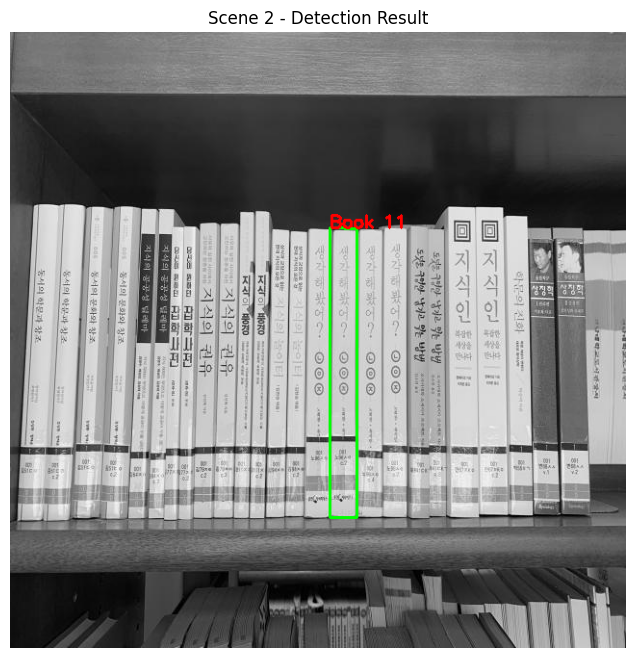


Scene 3 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 0 instance(s) found:
Book 17 - 0 instance(s) found:
Book 18 - 0 instance(s) found:
Book 19 - 0 instance(s) found:
Book 20 - 0 instance(s) found:
Book 21 - 0 instance(s) found:


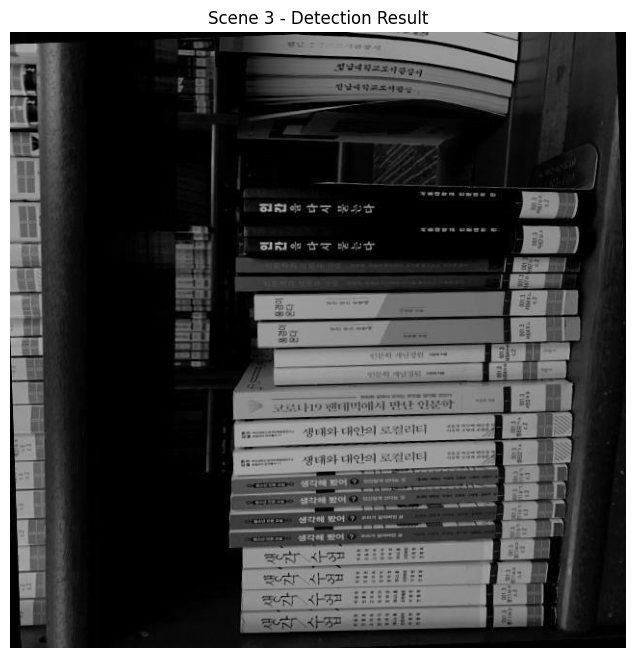


Scene 4 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 0 instance(s) found:
Book 17 - 0 instance(s) found:
Book 18 - 0 instance(s) found:
Book 19 - 0 instance(s) found:
Book 20 - 0 instance(s) found:
Book 21 - 0 instance(s) found:


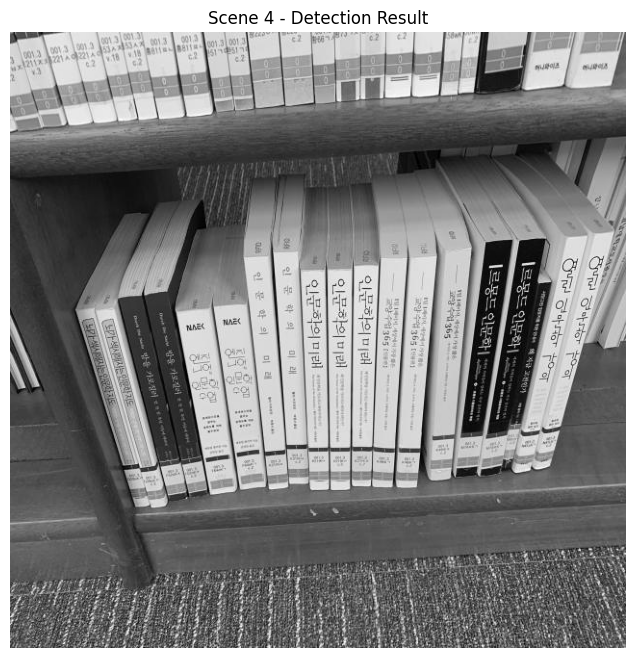


Scene 5 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 0 instance(s) found:
Book 17 - 0 instance(s) found:
Book 18 - 0 instance(s) found:
Book 19 - 0 instance(s) found:
Book 20 - 0 instance(s) found:
Book 21 - 0 instance(s) found:


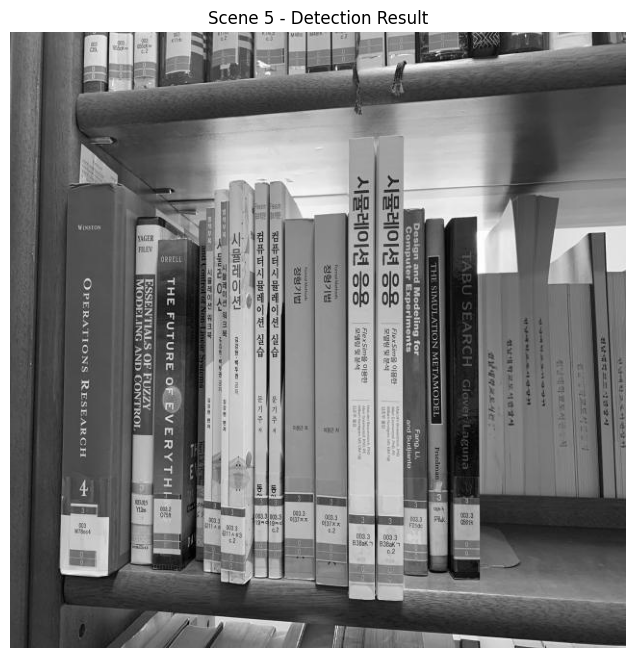


Scene 6 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 0 instance(s) found:
Book 17 - 0 instance(s) found:
Book 18 - 0 instance(s) found:
Book 19 - 0 instance(s) found:
Book 20 - 0 instance(s) found:
Book 21 - 0 instance(s) found:


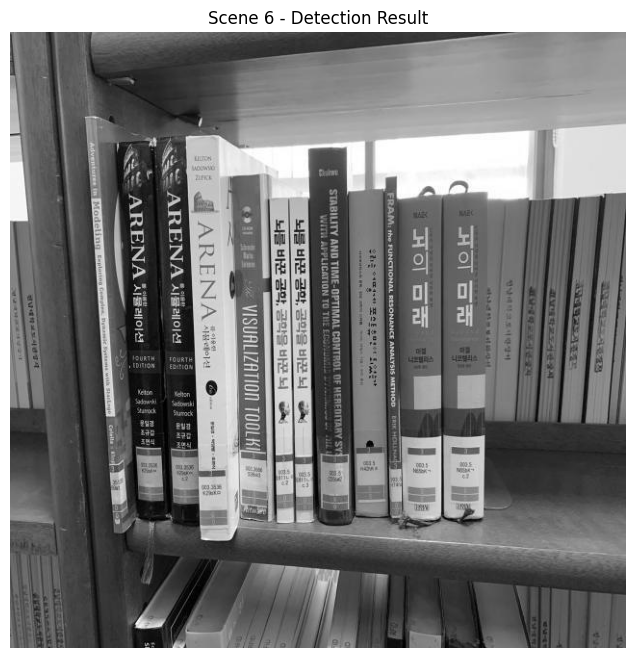


Scene 7 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 1 instance(s) found:
  Instance 1 {
    top_left: (np.int64(257), np.int64(187)), top_right: (np.int64(298), np.int64(187)),
    bottom_right: (np.int64(292), np.int64(536)), bottom_left: (np.int64(251), np.int64(535)),
    area: 14291px }
Book 4 - 1 instance(s) found:
  Instance 1 {
    top_left: (np.int64(500), np.int64(213)), top_right: (np.int64(529), np.int64(216)),
    bottom_right: (np.int64(524), np.int64(528)), bottom_left: (np.int64(494), np.int64(528)),
    area: 9256px }
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 0 insta

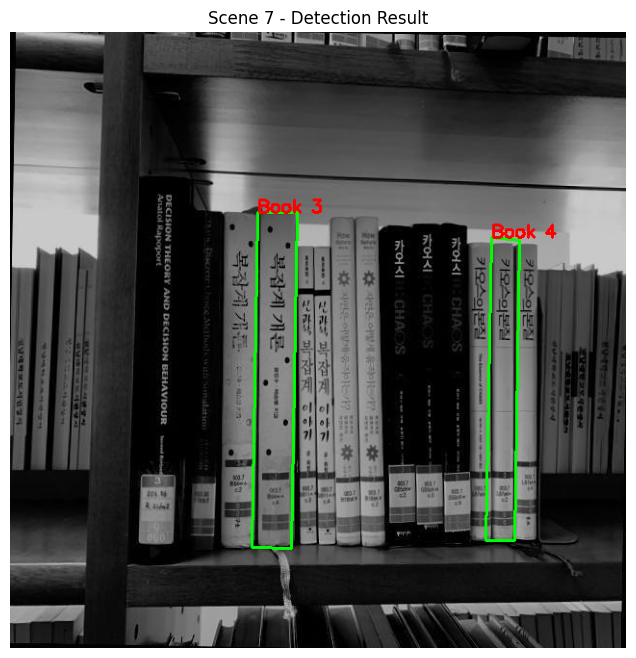


Scene 8 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 1 instance(s) found:
  Instance 1 {
    top_left: (np.int64(257), np.int64(187)), top_right: (np.int64(299), np.int64(187)),
    bottom_right: (np.int64(293), np.int64(536)), bottom_left: (np.int64(251), np.int64(534)),
    area: 14622px }
Book 4 - 1 instance(s) found:
  Instance 1 {
    top_left: (np.int64(500), np.int64(214)), top_right: (np.int64(529), np.int64(216)),
    bottom_right: (np.int64(524), np.int64(528)), bottom_left: (np.int64(494), np.int64(527)),
    area: 9227px }
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 0 insta

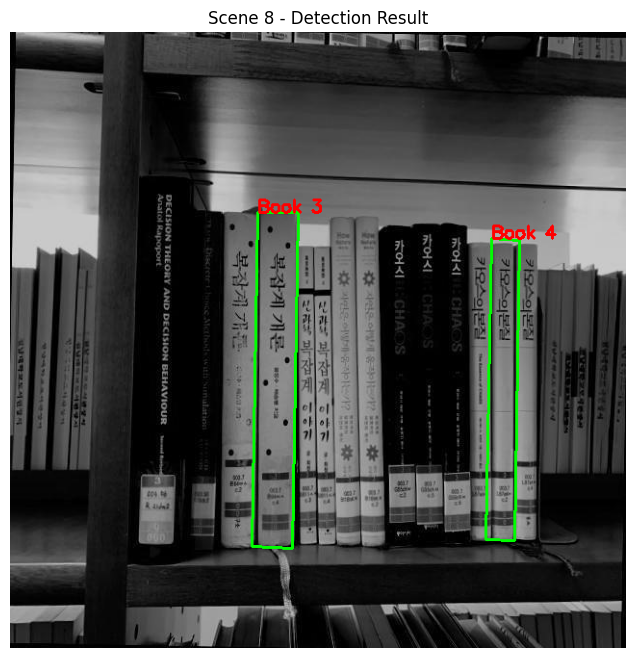


Scene 9 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 1 instance(s) found:
  Instance 1 {
    top_left: (np.int64(254), np.int64(187)), top_right: (np.int64(296), np.int64(187)),
    bottom_right: (np.int64(296), np.int64(536)), bottom_left: (np.int64(254), np.int64(535)),
    area: 14637px }
Book 4 - 1 instance(s) found:
  Instance 1 {
    top_left: (np.int64(497), np.int64(211)), top_right: (np.int64(527), np.int64(210)),
    bottom_right: (np.int64(527), np.int64(524)), bottom_left: (np.int64(497), np.int64(524)),
    area: 9405px }
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 0 insta

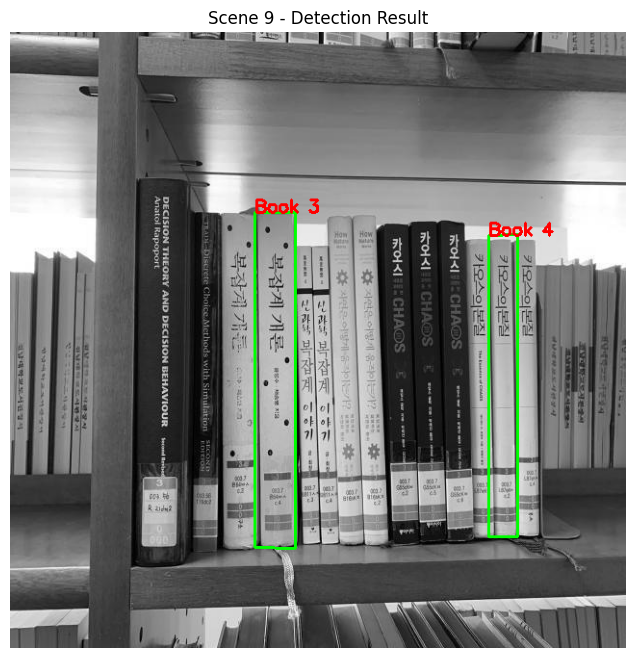


Scene 10 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 1 instance(s) found:
  Instance 1 {
    top_left: (np.int64(108), np.int64(38)), top_right: (np.int64(136), np.int64(39)),
    bottom_right: (np.int64(136), np.int64(585)), bottom_left: (np.int64(108), np.int64(585)),
    area: 15302px }
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 0 instance(s) found:
Book 17 - 0 instance(s) found:
Book 18 - 0 instance(s) found:
Book 19 - 0 instance(s) found:
Book 20 - 1 instance(s) found:
  Instance 1 {
    top_left: (np.int64(291), np.int64(131)), top_right: (np.int64

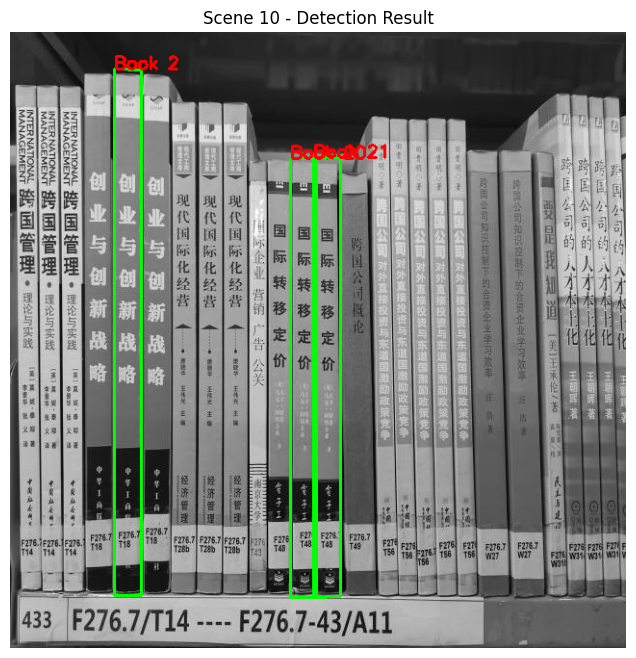


Scene 11 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 0 instance(s) found:
Book 17 - 0 instance(s) found:
Book 18 - 1 instance(s) found:
  Instance 1 {
    top_left: (np.int64(385), np.int64(31)), top_right: (np.int64(411), np.int64(32)),
    bottom_right: (np.int64(411), np.int64(579)), bottom_left: (np.int64(385), np.int64(579)),
    area: 14235px }
Book 19 - 2 instance(s) found:
  Instance 1 {
    top_left: (np.int64(497), np.int64(45)), top_right: (np.int64(534), np.int64(37)),
    bottom

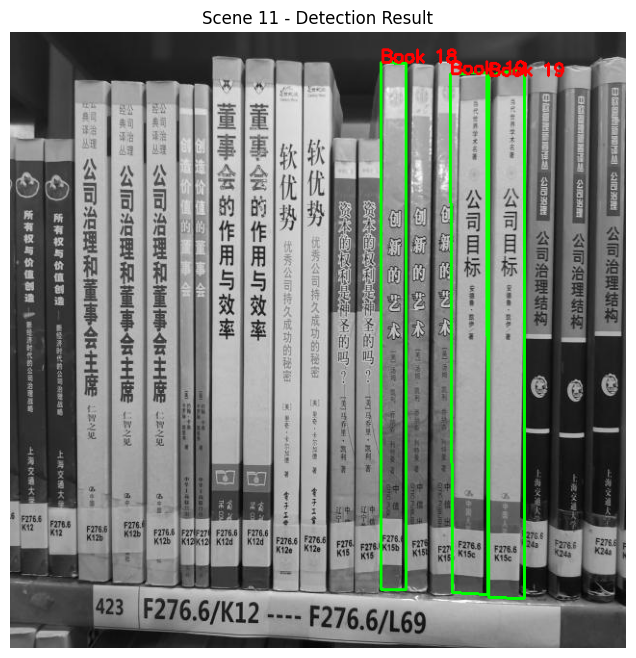


Scene 12 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 1 instance(s) found:
  Instance 1 {
    top_left: (np.int64(283), np.int64(25)), top_right: (np.int64(318), np.int64(25)),
    bottom_right: (np.int64(318), np.int64(503)), bottom_left: (np.int64(283), np.int64(504)),
    area: 16747px }
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 0 instance(s) found:
Book 17 - 0 instance(s) found:
Book 18 - 0 instance(s) found:
Book 19 - 0 instance(s) found:
Book 20 - 0 instance(s) found:
Book 21 - 0 instance(s) found:


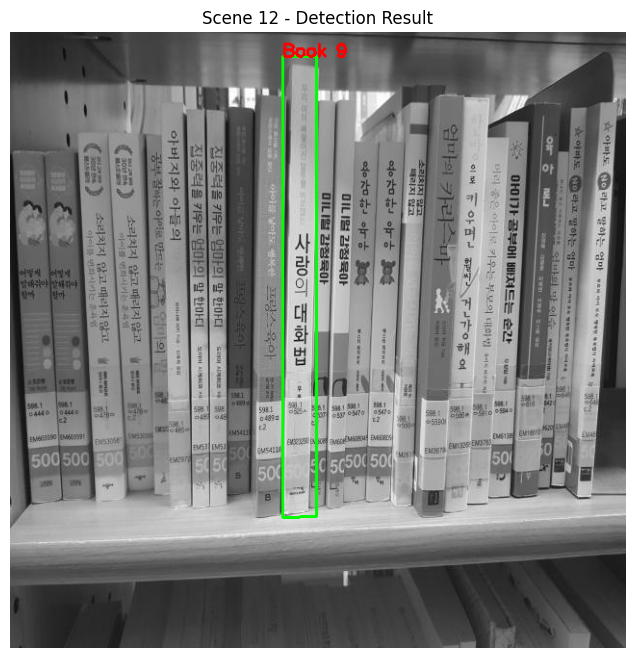


Scene 13 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 0 instance(s) found:
Book 17 - 0 instance(s) found:
Book 18 - 0 instance(s) found:
Book 19 - 0 instance(s) found:
Book 20 - 0 instance(s) found:
Book 21 - 0 instance(s) found:


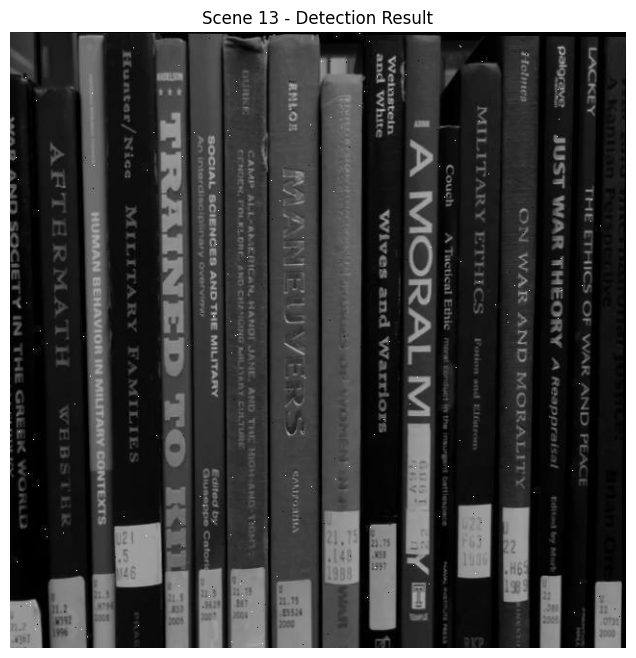


Scene 14 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 0 instance(s) found:
Book 17 - 0 instance(s) found:
Book 18 - 0 instance(s) found:
Book 19 - 0 instance(s) found:
Book 20 - 0 instance(s) found:
Book 21 - 0 instance(s) found:


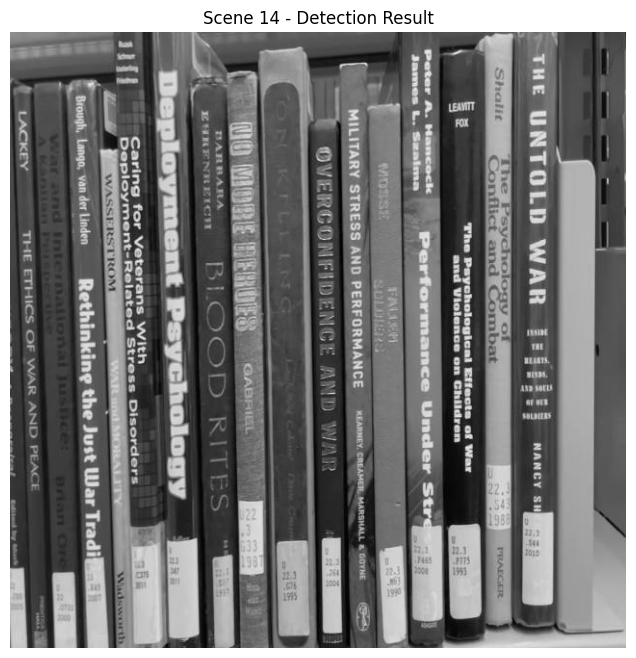


Scene 15 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 0 instance(s) found:
Book 17 - 0 instance(s) found:
Book 18 - 0 instance(s) found:
Book 19 - 0 instance(s) found:
Book 20 - 0 instance(s) found:
Book 21 - 0 instance(s) found:


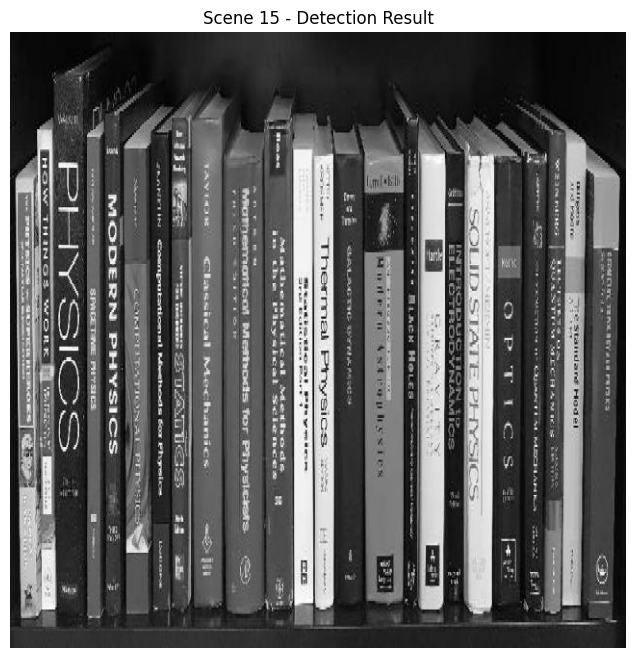


Scene 16 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 0 instance(s) found:
Book 17 - 1 instance(s) found:
  Instance 1 {
    top_left: (np.int64(342), np.int64(149)), top_right: (np.int64(391), np.int64(149)),
    bottom_right: (np.int64(391), np.int64(572)), bottom_left: (np.int64(342), np.int64(572)),
    area: 20727px }
Book 18 - 0 instance(s) found:
Book 19 - 0 instance(s) found:
Book 20 - 0 instance(s) found:
Book 21 - 0 instance(s) found:


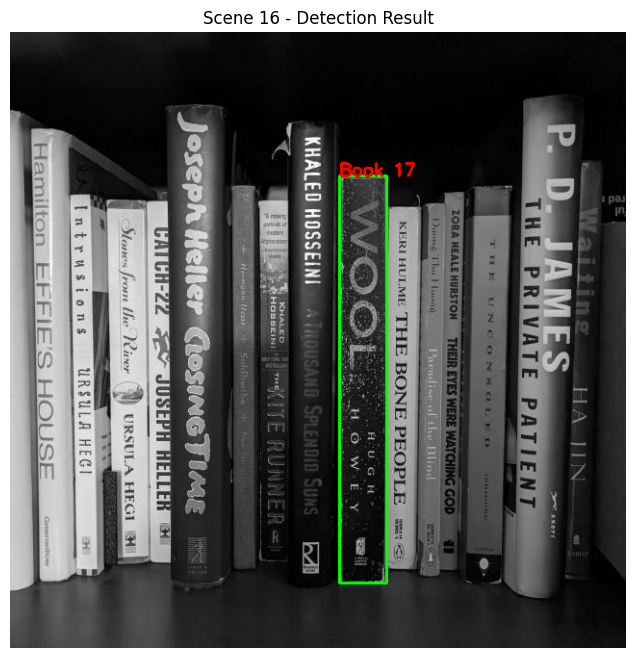


Scene 17 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 0 instance(s) found:
Book 17 - 0 instance(s) found:
Book 18 - 0 instance(s) found:
Book 19 - 0 instance(s) found:
Book 20 - 0 instance(s) found:
Book 21 - 0 instance(s) found:


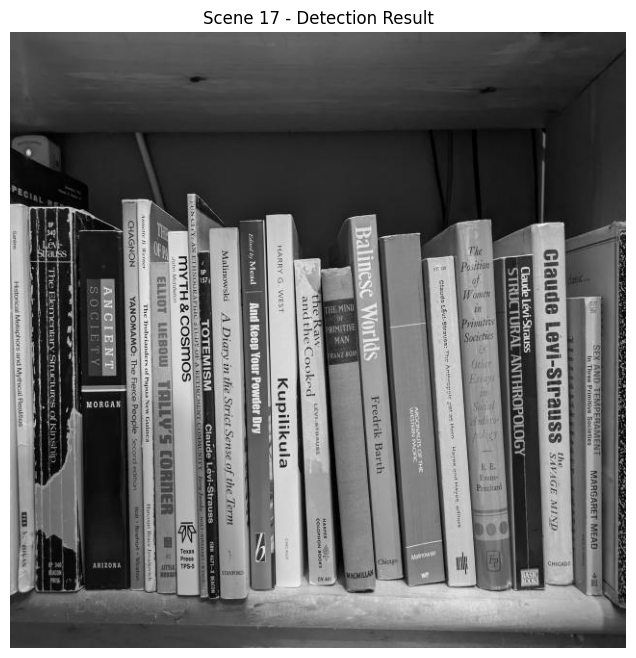


Scene 18 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 0 instance(s) found:
Book 17 - 0 instance(s) found:
Book 18 - 0 instance(s) found:
Book 19 - 0 instance(s) found:
Book 20 - 0 instance(s) found:
Book 21 - 0 instance(s) found:


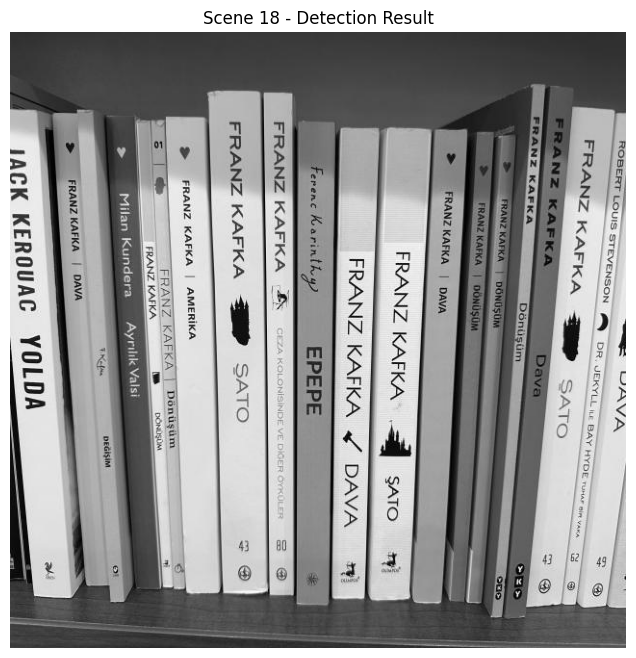


Scene 19 Analysis:
----------------------------------------
Book 0 - 1 instance(s) found:
  Instance 1 {
    top_left: (np.int64(210), np.int64(180)), top_right: (np.int64(244), np.int64(180)),
    bottom_right: (np.int64(244), np.int64(568)), bottom_left: (np.int64(210), np.int64(568)),
    area: 13192px }
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 1 instance(s) found:
  Instance 1 {
    top_left: (np.int64(248), np.int64(183)), top_right: (np.int64(432), np.int64(183)),
    bottom_right: (np.int64(432), np.int64(526)), bottom_left: (np.int64(248), np.int64(526)),
    

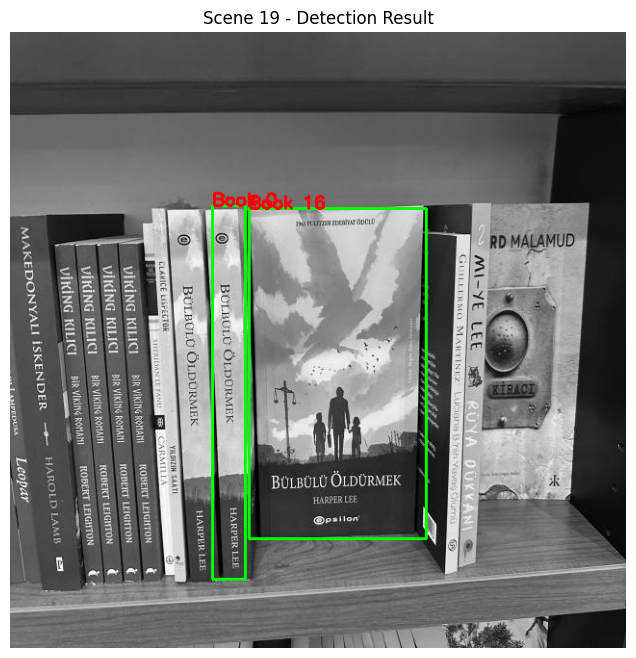


Scene 20 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 1 instance(s) found:
  Instance 1 {
    top_left: (np.int64(257), np.int64(146)), top_right: (np.int64(302), np.int64(146)),
    bottom_right: (np.int64(302), np.int64(563)), bottom_left: (np.int64(257), np.int64(564)),
    area: 18787px }
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 1 instance(s) found:
  Instance 1 {
    top_left: (np.int64(416), np.int64(142)), top_right: (np.int64(466), np.int64(143)),
    bottom_right: (np.int64(449), np.int64(566)), bottom_left: (np.int64(400), np.int64(567)),
    area: 20988px }
Book 16 - 0 ins

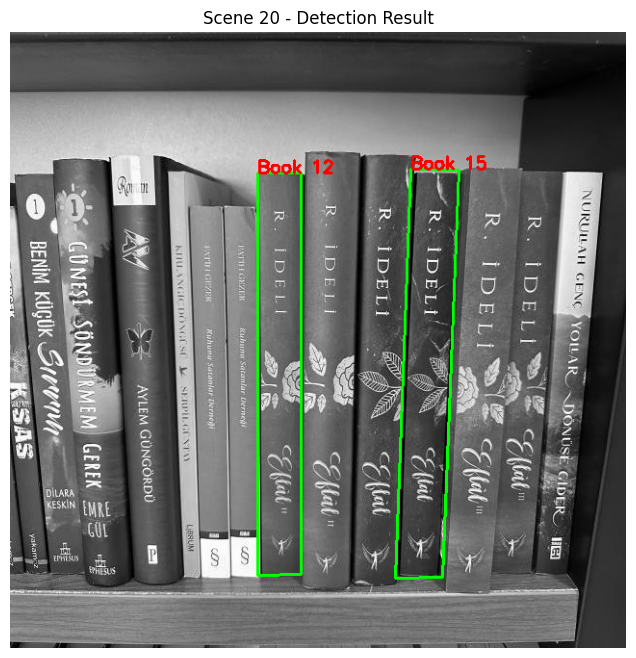


Scene 21 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 1 instance(s) found:
  Instance 1 {
    top_left: (np.int64(206), np.int64(247)), top_right: (np.int64(236), np.int64(248)),
    bottom_right: (np.int64(236), np.int64(554)), bottom_left: (np.int64(206), np.int64(555)),
    area: 9210px }
Book 2 - 0 instance(s) found:
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 0 instance(s) found:
Book 17 - 0 instance(s) found:
Book 18 - 0 instance(s) found:
Book 19 - 0 instance(s) found:
Book 20 - 0 instance(s) found:
Book 21 - 0 instance(s) found:


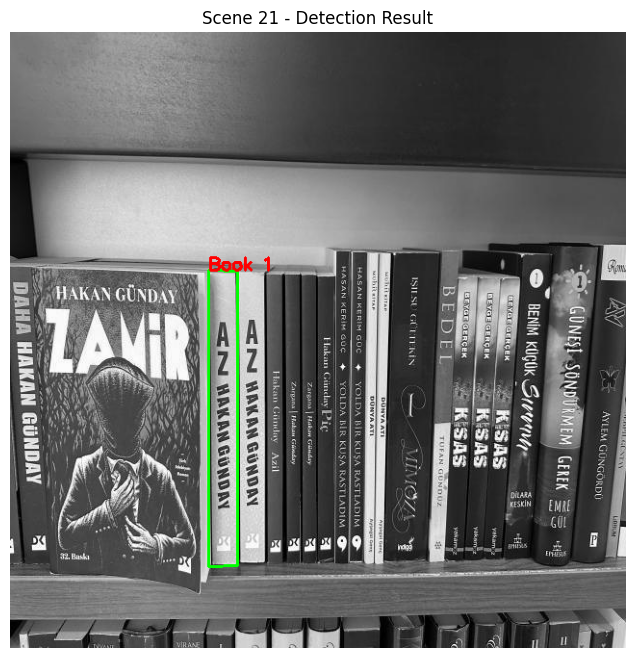


Scene 22 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 1 instance(s) found:
  Instance 1 {
    top_left: (np.int64(377), np.int64(209)), top_right: (np.int64(426), np.int64(209)),
    bottom_right: (np.int64(426), np.int64(542)), bottom_left: (np.int64(377), np.int64(542)),
    area: 16317px }
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 0 instance(s) found:
Book 17 - 0 instance(s) found:
Book 18 - 0 instance(s) found:
Book 19 - 0 instance(s) found:
Book 20 - 0 instance(s) found:
Book 21 - 0 instance(s) found:


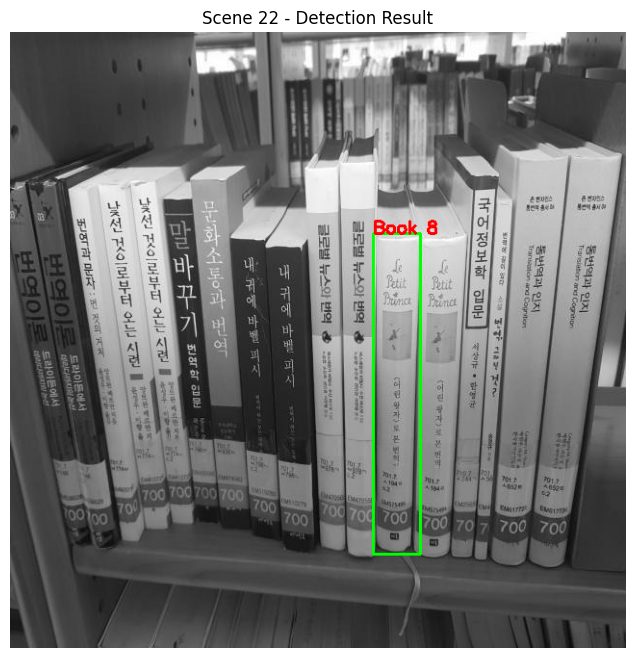


Scene 23 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 0 instance(s) found:
Book 6 - 2 instance(s) found:
  Instance 1 {
    top_left: (np.int64(92), np.int64(1)), top_right: (np.int64(135), np.int64(2)),
    bottom_right: (np.int64(135), np.int64(617)), bottom_left: (np.int64(92), np.int64(617)),
    area: 26466px }
  Instance 2 {
    top_left: (np.int64(55), np.int64(-3)), top_right: (np.int64(99), np.int64(-2)),
    bottom_right: (np.int64(102), np.int64(620)), bottom_left: (np.int64(59), np.int64(618)),
    area: 27030px }
Book 7 - 2 instance(s) found:
  Instance 1 {
    top_left: (np.int64(226), np.int64(48)), top_right: (np.int64(268), np.int64(48)),
    bottom_right: (np.int64(268), np.int64(609)), bottom_left: (np.int64(226), np.int64(609)),
    area: 23562px }
  Instance 2 {
    top_left: (np.int64(191), np.int64(4

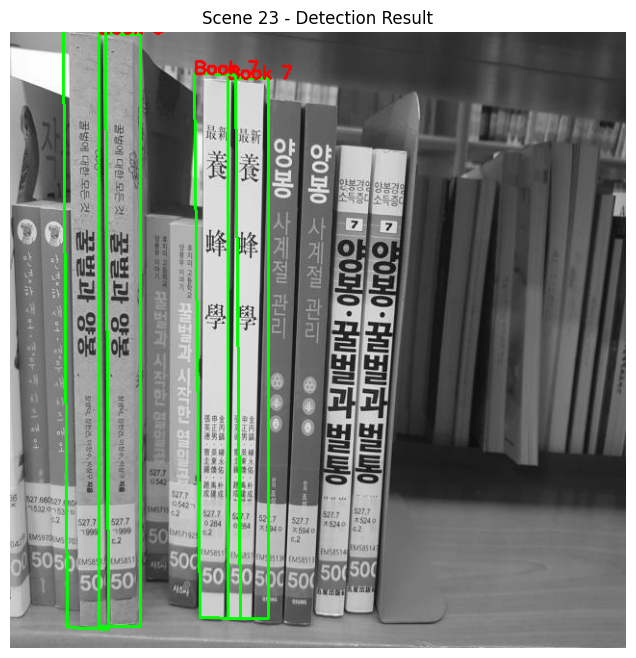


Scene 24 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 1 instance(s) found:
  Instance 1 {
    top_left: (np.int64(102), np.int64(69)), top_right: (np.int64(146), np.int64(69)),
    bottom_right: (np.int64(146), np.int64(573)), bottom_left: (np.int64(102), np.int64(573)),
    area: 22176px }
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 0 instance(s) found:
Book 17 - 0 instance(s) found:
Book 18 - 0 instance(s) found:
Book 19 - 0 instance(s) found:
Book 20 - 0 instance(s) found:
Book 21 - 0 instance(s) found:


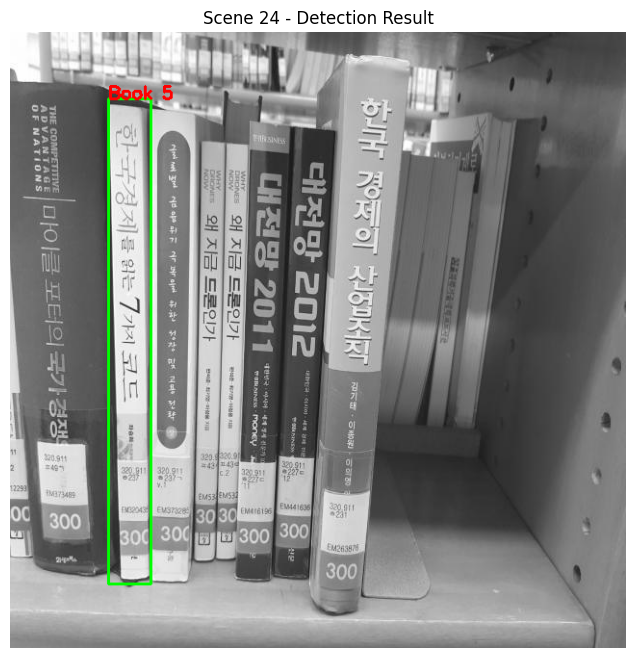


Scene 25 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 1 instance(s) found:
  Instance 1 {
    top_left: (np.int64(217), np.int64(73)), top_right: (np.int64(271), np.int64(73)),
    bottom_right: (np.int64(271), np.int64(564)), bottom_left: (np.int64(217), np.int64(564)),
    area: 26514px }
Book 15 - 0 instance(s) found:
Book 16 - 0 instance(s) found:
Book 17 - 0 instance(s) found:
Book 18 - 0 instance(s) found:
Book 19 - 0 instance(s) found:
Book 20 - 0 instance(s) found:
Book 21 - 0 instance(s) found:


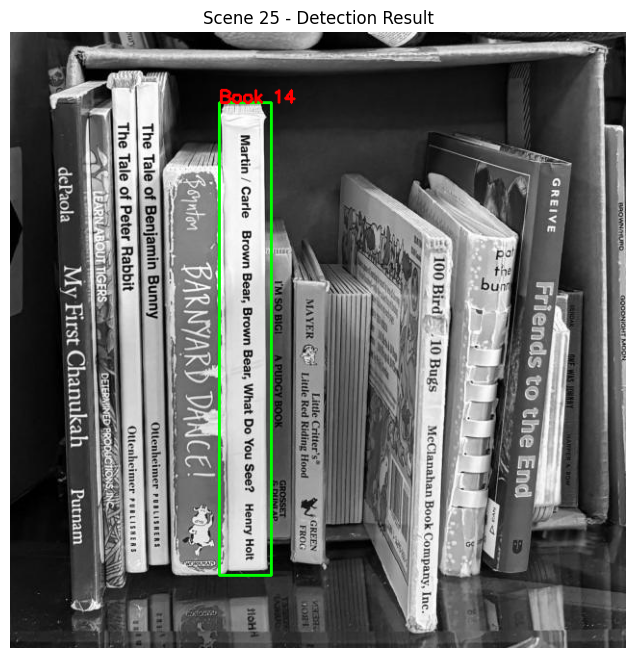


Scene 26 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 2 instance(s) found:
  Instance 1 {
    top_left: (np.int64(236), np.int64(173)), top_right: (np.int64(290), np.int64(173)),
    bottom_right: (np.int64(290), np.int64(555)), bottom_left: (np.int64(236), np.int64(555)),
    area: 20628px }
  Instance 2 {
    top_left: (np.int64(279), np.int64(169)), top_right: (np.int64(334), np.int64(171)),
    bottom_right: (np.int64(331), np.int64(562)), bottom_left: (np.int64(277), np.int64(560)),
    area: 21314px }
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 0 ins

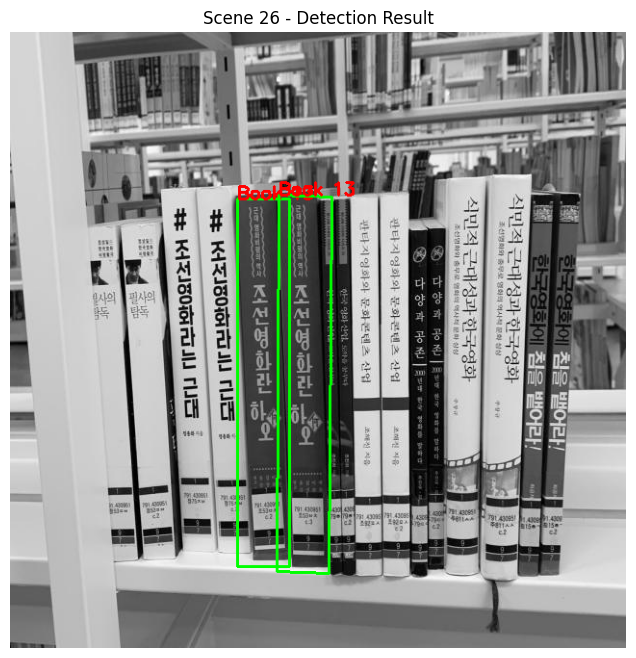


Scene 27 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 0 instance(s) found:
Book 17 - 0 instance(s) found:
Book 18 - 0 instance(s) found:
Book 19 - 0 instance(s) found:
Book 20 - 0 instance(s) found:
Book 21 - 0 instance(s) found:


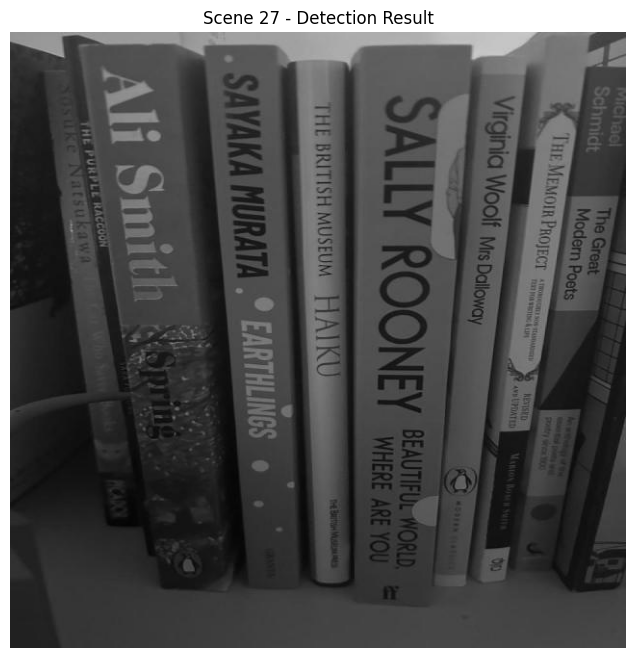


Scene 28 Analysis:
----------------------------------------
Book 0 - 0 instance(s) found:
Book 1 - 0 instance(s) found:
Book 2 - 0 instance(s) found:
Book 3 - 0 instance(s) found:
Book 4 - 0 instance(s) found:
Book 5 - 0 instance(s) found:
Book 6 - 0 instance(s) found:
Book 7 - 0 instance(s) found:
Book 8 - 0 instance(s) found:
Book 9 - 0 instance(s) found:
Book 10 - 0 instance(s) found:
Book 11 - 0 instance(s) found:
Book 12 - 0 instance(s) found:
Book 13 - 0 instance(s) found:
Book 14 - 0 instance(s) found:
Book 15 - 0 instance(s) found:
Book 16 - 0 instance(s) found:
Book 17 - 0 instance(s) found:
Book 18 - 0 instance(s) found:
Book 19 - 0 instance(s) found:
Book 20 - 0 instance(s) found:
Book 21 - 0 instance(s) found:


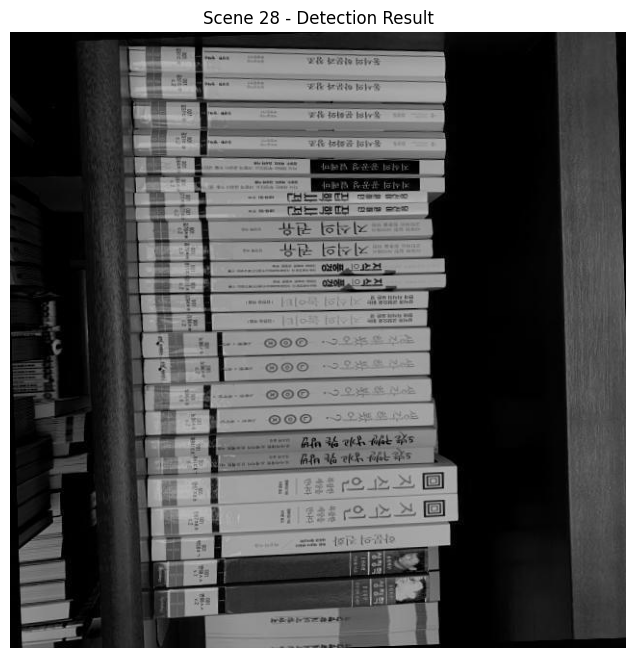

In [24]:
run_detection_and_report_all_models()